# Imports

In [1]:
import mne
import numpy as np
import pandas as pd

from pyxdf import load_xdf

import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from time import time
from mne.preprocessing import ICA
from mne_icalabel import label_components
from meegkit.asr import ASR
from meegkit.utils.matrix import sliding_window

# Utils

In [3]:
def freq_to_band(freq, bands):
    for band_name, (fmin, fmax) in bands.items():
        if fmin <= freq <= fmax:
            return band_name
    return np.nan

# Params

In [4]:
data_directory = '..\\Data\\XDF'

teams = {
    1:'SCASE',
    2:'Michel',
    3:'Py',
    4:'JahanP',
}

subject = 4
file_format = 'xdf'

micro_to_volt_ratio = 10**-6 #mne default unit is volt

In [5]:
ch_name_df = pd.read_csv('..\\Data\\biosemi_channels.csv')
biosemi_to_1020_names = dict(zip(ch_name_df['Alphabetical'], ch_name_df['1020']))

In [6]:
bands = {
    'theta': (4, 8), 
    'alpha': (8, 12),
    'lowbeta ': (12, 20), 
    'highbeta': (20, 30), 
    'gamma': (30, 40)
    }

In [7]:
backend = 'matplotlib'

# Loading

In [8]:
mne.viz.set_browser_backend(backend, verbose=None)

Using matplotlib as 2D backend.


## XDF

Data unit(s) : {'microvolts'}


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\2177029599.py:41: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.set_xlim(int(frequencies.min()), int(frequencies.max()))


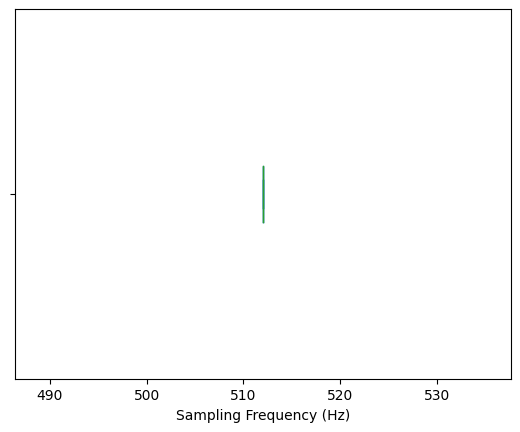

Creating RawArray with float64 data, n_channels=89, n_times=498212
    Range : 0 ... 498211 =      0.000 ...   973.011 secs
Ready.


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,Not available
Good channels,"25 misc, 64 EEG"
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,512.03 Hz
Highpass,0.00 Hz
Lowpass,256.02 Hz


In [9]:
# If xdf
fname = f'sub-P00{subject}_ses-S001_task-Default_run-001_eeg_{teams[subject]}'

if file_format == 'xdf':
    xdf, info = load_xdf(f'{data_directory}\\{fname}.xdf')
    
    # Extract eeg stream and markers for later
    all_markers = []
    for stream in xdf:
        if stream['info']['type'][0] == 'EEG':
            eeg_xdf = stream
        elif stream['info']['type'][0] == 'Markers':
            marker_df = pd.DataFrame(data={'time' : stream['time_stamps'], 'name' : np.array(stream['time_series']).T[0]})
            all_markers.append(marker_df)
            
    all_marker_df = pd.concat(all_markers).sort_values(by='time')
    
    # Extract eeg infos
    ## Timestamps and values
    eeg_values = np.array(eeg_xdf['time_series'])
    eeg_times = eeg_xdf['time_stamps']

    ## Metadata
    biosemi_to_mne_types = {
        'EEG':'eeg',
        'AUX':'misc',
        'EXG':'misc',
        'Trigger':'misc',
    }

    ch_names = [ch['label'][0] for ch in eeg_xdf['info']['desc'][0]['channels'][0]['channel']]
    ch_types = [biosemi_to_mne_types[ch['type'][0]] for ch in eeg_xdf['info']['desc'][0]['channels'][0]['channel']]
    units = set([ch['unit'][0] for ch in eeg_xdf['info']['desc'][0]['channels'][0]['channel']])
    print('Data unit(s) :', units)

    ## Focus on sampling frequency because of my PTSDs
    frequencies = pd.Series(1/np.diff(eeg_times))
    
    fig, ax = plt.subplots()
    frequencies.plot(kind="box", vert=False, ax=ax)
    ax.set_xlim(int(frequencies.min()), int(frequencies.max()))
    ax.set_xlabel('Sampling Frequency (Hz)')
    plt.show()

    sfreq = frequencies.mean()

    # Create MNE Raw object
    raw_info = mne.create_info(ch_names = ch_names, sfreq = sfreq, ch_types = ch_types)
    raw_data = eeg_values.T #xdf is (n_samples, n_channels) while mne is (n_channels, n_samples)
    raw_data*= micro_to_volt_ratio
    raw = mne.io.RawArray(raw_data, raw_info)
    
    # Add markers as annotations
    annotations = mne.Annotations(
        onset = all_marker_df['time']-eeg_xdf['time_stamps'][0],  # in seconds, aligned with eeg time serie
        duration=[0]*len(all_marker_df),  # often 0 for us
        description=all_marker_df['name'],
        )
    raw.set_annotations(annotations)

    display(raw)

## Set

In [10]:
# If set
if file_format == 'set':
    raw = mne.io.read_raw_eeglab(f'{data_directory}\\sub-{subject}\\{subject}.set', preload=True)

    unknown_types = {
        'aux': ['AUX1', 'AUX10', 'AUX11', 'AUX12', 'AUX13', 'AUX14', 'AUX15', 'AUX16', 'AUX2', 'AUX3', 'AUX4', 'AUX5', 'AUX6', 'AUX7', 'AUX8', 'AUX9'],
        'exg': ['EX1', 'EX2', 'EX3', 'EX4', 'EX5', 'EX6', 'EX7', 'EX8'],
        'trigger': ['Trig1'],
    }

    unknown_ch = [ch for l in list(unknown_types.values()) for ch in l]
    new_types = ['misc' if ch in unknown_ch else 'eeg' for ch in raw.ch_names]

    raw.set_channel_types(dict(zip(raw.ch_names, new_types)))

    display(raw)

## Montage

In [11]:
# Montage
mne.channels.get_builtin_montages()
standard_1020 = mne.channels.make_standard_montage('standard_1020')

raw.pick('eeg') # Keep only channels of the montage
mne.rename_channels(raw.info, biosemi_to_1020_names)

raw.set_montage(standard_1020)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,512.03 Hz
Highpass,0.00 Hz
Lowpass,256.02 Hz


## Plot

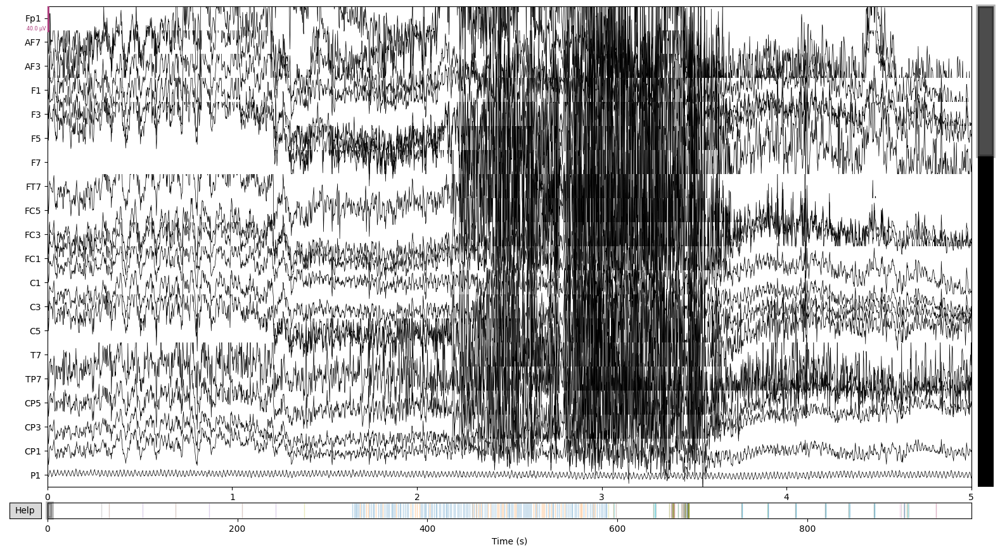

In [12]:
raw.plot(duration=5);

## Marker Visualization

In [13]:
events, original_event_dict = mne.events_from_annotations(raw)
r_original_event_dict = {value:key for key, value in original_event_dict.items()}

Used Annotations descriptions: ['3 pressed', '3 released', '7 pressed', '7 released', 'A pressed', 'A released', 'BACK pressed', 'BACK released', 'D pressed', 'D released', 'DOWN pressed', 'DOWN released', 'EC', 'EO', 'ESCAPE pressed', 'ESCAPE released', 'End', 'F pressed', 'F released', 'LEFT pressed', 'LEFT released', 'LMENU pressed', 'LMENU released', 'LWIN pressed', 'LWIN released', 'P pressed', 'P released', 'RETURN pressed', 'RETURN released', 'RIGHT pressed', 'RIGHT released', 'RSHIFT pressed', 'RSHIFT released', 'Start', 'TAB pressed', 'TAB released', 'normal', 'odd']


In [14]:
r_original_event_dict

{1: '3 pressed',
 2: '3 released',
 3: '7 pressed',
 4: '7 released',
 5: 'A pressed',
 6: 'A released',
 7: 'BACK pressed',
 8: 'BACK released',
 9: 'D pressed',
 10: 'D released',
 11: 'DOWN pressed',
 12: 'DOWN released',
 13: 'EC',
 14: 'EO',
 15: 'ESCAPE pressed',
 16: 'ESCAPE released',
 17: 'End',
 18: 'F pressed',
 19: 'F released',
 20: 'LEFT pressed',
 21: 'LEFT released',
 22: 'LMENU pressed',
 23: 'LMENU released',
 24: 'LWIN pressed',
 25: 'LWIN released',
 26: 'P pressed',
 27: 'P released',
 28: 'RETURN pressed',
 29: 'RETURN released',
 30: 'RIGHT pressed',
 31: 'RIGHT released',
 32: 'RSHIFT pressed',
 33: 'RSHIFT released',
 34: 'Start',
 35: 'TAB pressed',
 36: 'TAB released',
 37: 'normal',
 38: 'odd'}

In [15]:
event_df = pd.DataFrame(data=events, columns=['index', 'duration', 'id'])
event_df['name'] = event_df['id'].apply(lambda x : r_original_event_dict[x])
event_df['time'] = event_df['index']/int(raw.info['sfreq'])
event_df[-10:]

,index,duration,id,name,time
261,461765,0,9,D pressed,901.884766
262,461853,0,10,D released,902.056641
263,461929,0,25,LWIN released,902.205078
264,463231,0,24,LWIN pressed,904.748047
265,463440,0,26,P pressed,905.156250
266,463523,0,27,P released,905.318359
267,464023,0,27,P released,906.294922
268,464313,0,25,LWIN released,906.861328
269,478997,0,5,A pressed,935.541016
270,479055,0,6,A released,935.654297


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\2111091752.py:2: RuntimeWarning: More events than default colors available. You should pass a list of unique colors.
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=original_event_dict)


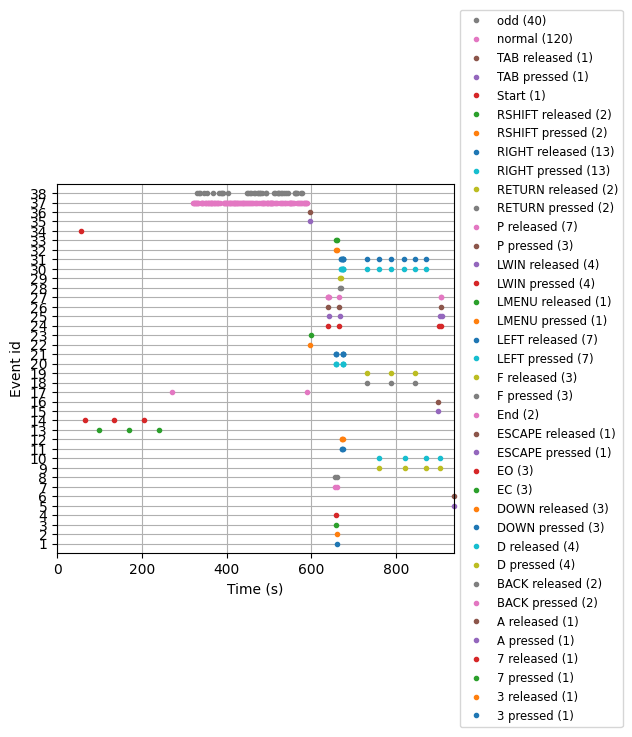

In [16]:
#All markers
fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=original_event_dict)
fig_events;

C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\3356605378.py:6: RuntimeWarning: event 1 missing from event_id will be ignored
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\3356605378.py:6: RuntimeWarning: event 2 missing from event_id will be ignored
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\3356605378.py:6: RuntimeWarning: event 3 missing from event_id will be ignored
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\3356605378.py:6: RuntimeWarning: event 4 missing from event_id will be ignored
  fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\3356605378.py:6: RuntimeWar

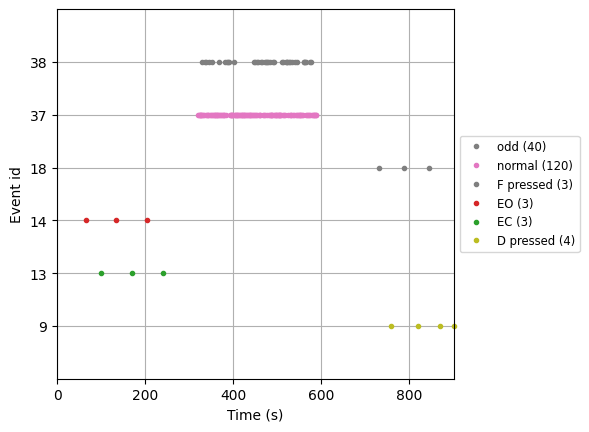

In [17]:
#Or maybe just a subset
selected_markers = ['EO', 'EC', 'normal', 'odd', 'F pressed', 'D pressed']
selected_event_dict = {key:value for key, value in original_event_dict.items() if key in selected_markers}


fig_events = mne.viz.plot_events(events, sfreq=raw.info['sfreq'], event_id=selected_event_dict)
fig_events;

## Cropping

In [18]:
print("Trigger 'Start' is sent few moments after recording begins")
display(event_df[event_df['name']=='Start'])

print("There is a surnumerary 'D pressed' few moments before recording ends")
plot_df = event_df[event_df['name']=='D pressed'].copy()
plot_df['time_to_end'] = (len(raw) -  event_df[event_df['name']=='D pressed']['index'])/512
display(plot_df)

Trigger 'Start' is sent few moments after recording begins


,index,duration,id,name,time
0,29074,0,34,Start,56.785156


There is a surnumerary 'D pressed' few moments before recording ends


,index,duration,id,name,time,time_to_end
240,388520,0,9,D pressed,758.828125,214.242188
248,419602,0,9,D pressed,819.535156,153.535156
256,445930,0,9,D pressed,870.957031,102.113281
261,461765,0,9,D pressed,901.884766,71.185547


In [19]:
tmin = event_df[event_df['name']=='Start']['time'].sort_values().tolist()[0] # At Start trigger
tmax = event_df[event_df['name']=='D pressed']['time'].sort_values().tolist()[2] + 20 # 20s after 3rd D pressed trigger
raw.crop(tmin, tmax)

Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,512.03 Hz
Highpass,0.00 Hz
Lowpass,256.02 Hz


# Preprocessing

In [20]:
clean = raw.copy()
clean.set_eeg_reference('average')
clean.filter(1,40)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1691 samples (3.303 s)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    0.4s finished


Measurement date,Unknown
Experimenter,Unknown
Participant,Unknown
Digitized points,67 points
Good channels,64 EEG
Bad channels,None
EOG channels,Not available
ECG channels,Not available
Sampling frequency,512.03 Hz
Highpass,1.00 Hz
Lowpass,40.00 Hz


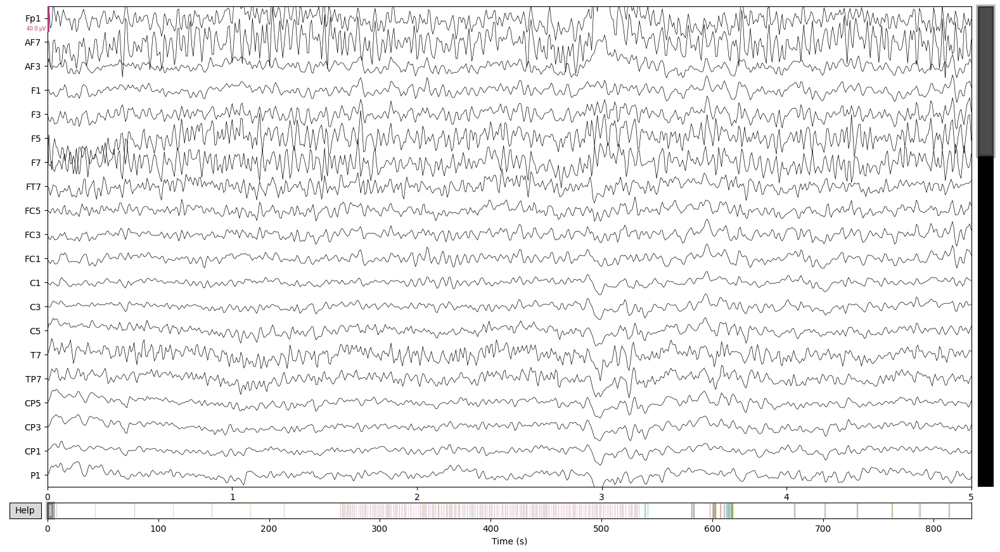

In [21]:
clean.plot(duration=5);

# Advanced Preprocessing

## ICA + ICLabel

In [22]:
def run_ica(data, method, output='iclabel', confidence=.80, fit_params=None, verbose=False):

    #Create ICA instance
    ica = ICA(
        # n_components=len(data.ch_names),
        n_components=20,
        method=method,
        fit_params=fit_params,
        max_iter="auto",
        random_state=0,
    )
    t0 = time()
    ica.fit(data)
    fit_time = time() - t0
    title = f"ICA decomposition using {method} (took {fit_time:.1f}s)"

    #Plot ICA components as pseudo channels
    if output == 'source':
        ica.plot_sources(data, title=title)
        return ica
    #Plot ICA components as topomaps
    elif output == 'component':
        ica.plot_components(title=title)
        return ica

    #Reject artifactual components using IClabel + confidence threshold and return reconstructed data
    elif output == 'iclabel':
        ic_labels = label_components(data, ica, method="iclabel")

        confident_labels = [idx for idx, proba in enumerate(ic_labels['y_pred_proba']) if proba>confidence]
        exclude_idx = [idx for idx, label in enumerate(ic_labels['labels']) if idx in confident_labels and label not in ["brain", "other"]]

        #Plot rejected components as topomaps
        if verbose and len(exclude_idx)>0:
            ica.plot_components(picks=exclude_idx);

        reconst_data = data.copy()
        ica.apply(reconst_data, exclude=exclude_idx)
        return reconst_data

In [23]:
def run_asr(data, tmin=0, tmax=30, method='euclid', fit_params=None):
    sfreq = data.info['sfreq']
    n_chans = len(data.ch_names)
    values = data.get_data()

    # Train on a clean portion of data
    asr = ASR(method=method)
    train_idx = np.arange(tmin * sfreq, tmax * sfreq, dtype=int)
    _, sample_mask = asr.fit(values[:, train_idx])

    # Apply filter using sliding (non-overlapping) windows
    X = sliding_window(values, window=int(sfreq), step=int(sfreq))
    Y = np.zeros_like(X)
    for i in range(X.shape[1]):
        Y[:, i, :] = asr.transform(X[:, i, :])

    clean_data = Y.reshape(n_chans, -1)    # reshape to (n_chans, n_times)

    out = mne.io.RawArray(clean_data, data.info)

    return out

Creating RawArray with float64 data, n_channels=64, n_times=427008
    Range : 0 ... 427007 =      0.000 ...   833.949 secs
Ready.
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Selecting by number: 20 components
Fitting ICA took 6.7s.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\37581470.py:20: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(data, ica, method="iclabel")
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\37581470.py:20: RuntimeWarning: The provided ICA instance was fitted with a 'fastica' algorithm. ICLabel was designed with extended infomax ICA decompositions. To use the extended infomax algorithm, use the 'mne.preprocessing.ICA' instance with the arguments 'ICA(method='infomax', fit_params=dict(extended=True))' (scikit-learn) or 'ICA(method='picard', fit_params=dict(ortho=False, extended=True))' (python-picard).
  ic_labels = label_components(data, ica, method="iclabel")


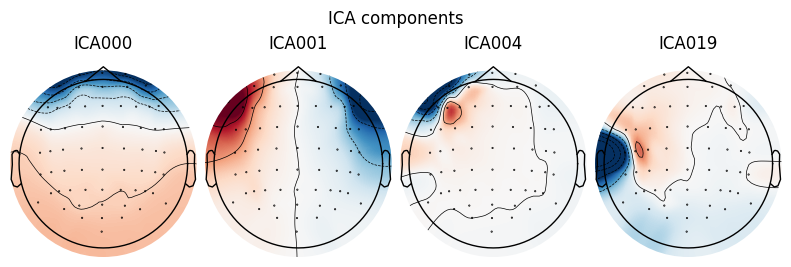

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 4 ICA components
    Projecting back using 64 PCA components
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Selecting by number: 20 components
Computing Extended Infomax ICA
Fitting ICA took 34.1s.
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\37581470.py:20: RuntimeWarning: The provided Raw instance is not filtered between 1 and 100 Hz. ICLabel was designed to classify features extracted from an EEG dataset bandpass filtered between 1 and 100 Hz (see the 'filter()' method for Raw and Epochs instances).
  ic_labels = label_components(data, ica, method="iclabel")


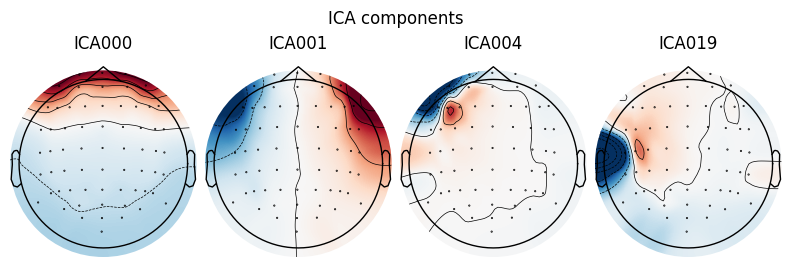

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 4 ICA components
    Projecting back using 64 PCA components


In [24]:
available_ica = [
    ('fastica', None), # fast to compute
    ('infomax', dict(extended=True)),   # needed for iclabel
    ]
fullclean_dict = {'none':clean}
fullclean_dict['asr'] = run_asr(clean, method='euclid', fit_params=None)
for method, params in available_ica :
    fullclean_dict[method] = run_ica(clean, method, 'iclabel', fit_params=params, verbose=True)

## Automatic Channel Rejection

In [25]:
#EEGLAB function to compute a z-score of Median Absolute Deviation (MAD) for each channel
from statsmodels import robust
def reject_by_noisiness(df, threshold=4, verbose=False):
    noisiness = df.apply(robust.mad)
    znoise = (noisiness - noisiness.median()) / (robust.mad(noisiness)*1.4826)
    znoise = znoise.apply(abs)
    
    if verbose :
        display(znoise.sort_values(ascending = False))

    bads = znoise[znoise>threshold]

    return bads.index.to_list()

In [26]:
#EEGLAB function to detect flat windows
def reject_by_flatness(df, sfreq, max_flatline_duration=5, max_allowed_jitter=20, verbose=False):
    bads = []
    
    jitter_thresh = max_allowed_jitter*np.spacing(1)*(10**6)
    diff_df = df.apply(lambda x : x.diff().abs())
    
    for ch in diff_df.columns:
        flats = diff_df[ch][diff_df[ch]<jitter_thresh]
        if len(flats) > 1:
            flat_idxs = np.concatenate([np.diff(flats.index), np.zeros(1)])
            flat_windows = [i/sfreq for i in range(len(flat_idxs)-1) if flat_idxs[i]!=flat_idxs[i+1] if flat_idxs[i]==1]
            flat_windows = flat_windows[0:1] + [flat_windows[i] - flat_windows[i-1] for i in range(1, len(flat_windows))]
            
            if verbose:
                print(ch, flat_windows)
            
            if len(flat_windows) and max(flat_windows) > max_flatline_duration:
                
                bads.append(ch)
    
    return bads 

In [27]:
for method, data in fullclean_dict.items():
    display(method)
    data_df = data.to_data_frame()[clean.ch_names]
    bads = reject_by_noisiness(data_df, threshold=4, verbose=False) + reject_by_flatness(data_df, data.info['sfreq'], verbose=False)
    bads = list(set(bads))
    data.info['bads'] = bads
    print('bads', bads)

'none'

bads ['AF7']


'asr'

bads ['AF7']


'fastica'

bads []


'infomax'

bads []


## Interpolation (tocheck)

In [28]:
#I'm not an expert but tutorials report that
for method, data in fullclean_dict.items():
    data.interpolate_bads(reset_bads=True)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 96.2 mm
Computing interpolation matrix from 63 sensor positions
Interpolating 1 sensors
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 96.2 mm
Computing interpolation matrix from 63 sensor positions
Interpolating 1 sensors
Setting channel interpolation method to {'eeg': 'spline'}.
Setting channel interpolation method to {'eeg': 'spline'}.


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1762402563.py:2: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  data.interpolate_bads(reset_bads=True)
C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1762402563.py:2: RuntimeWarning: No bad channels to interpolate. Doing nothing...
  data.interpolate_bads(reset_bads=True)


# Resting State

## Epoching

In [29]:
triggers = ['EC', 'EO']
current_event_dict = {key:value for key, value in original_event_dict.items() if key in triggers}

tmin = -0.5  # start of each epoch 
tmax = 25  # end of each epoch
baseline = None  # means from t before to stim onset (t = 0)
picks = mne.pick_types(clean.info, eeg=True)
reject = None # this can be highly data dependent

rs_allepochs = {}
for method, fullclean in fullclean_dict.items() :
    rs_allepochs[method] = mne.Epochs(fullclean, events, current_event_dict, tmin, tmax, proj=True,
                        picks=picks, baseline=baseline,
                        reject=reject, preload=True)

Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 6 events and 13058 original time points ...
0 bad epochs dropped
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 6 events and 13058 original time points ...
0 bad epochs dropped
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 6 events and 13058 original time points ...
0 bad epochs dropped
Not setting metadata
6 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 6 events and 13058 original time points ...
0 bad epochs dropped


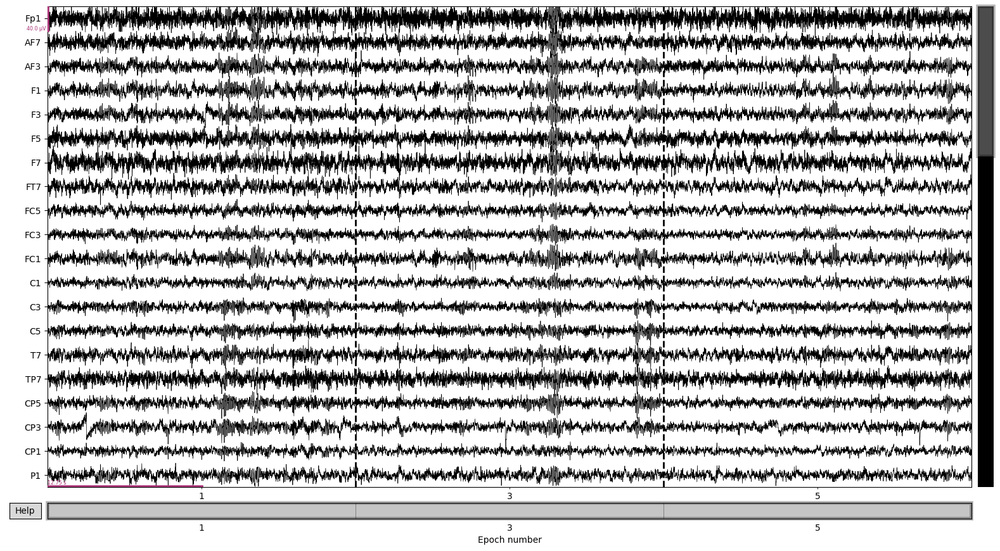

In [30]:
rs_allepochs['fastica']['EO'].plot();

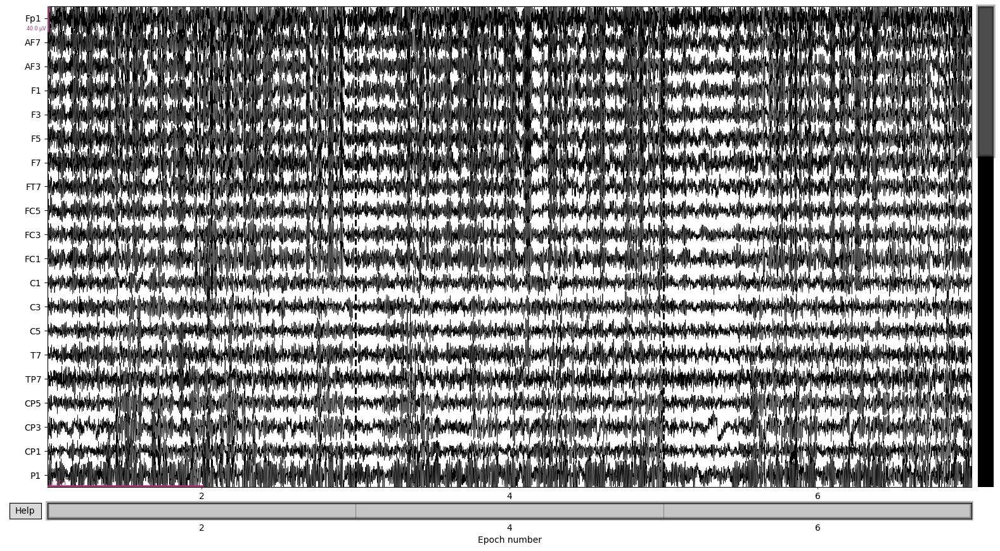

In [31]:
rs_allepochs['fastica']['EC'].plot();

## Frequency Bands Visualization

### General spectrum

    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Effective window size : 4.000 (s)
Averaging across epochs...
    Using multitaper spectrum estimation with 7 DPSS windows


C:\Python\Lib\site-packages\mne\viz\utils.py:165: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  (fig or plt).show(**kwargs)


Averaging across epochs...
Effective window size : 4.000 (s)
Averaging across epochs...
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Effective window size : 4.000 (s)
Averaging across epochs...
    Using multitaper spectrum estimation with 7 DPSS windows
Averaging across epochs...
Effective window size : 4.000 (s)
Averaging across epochs...


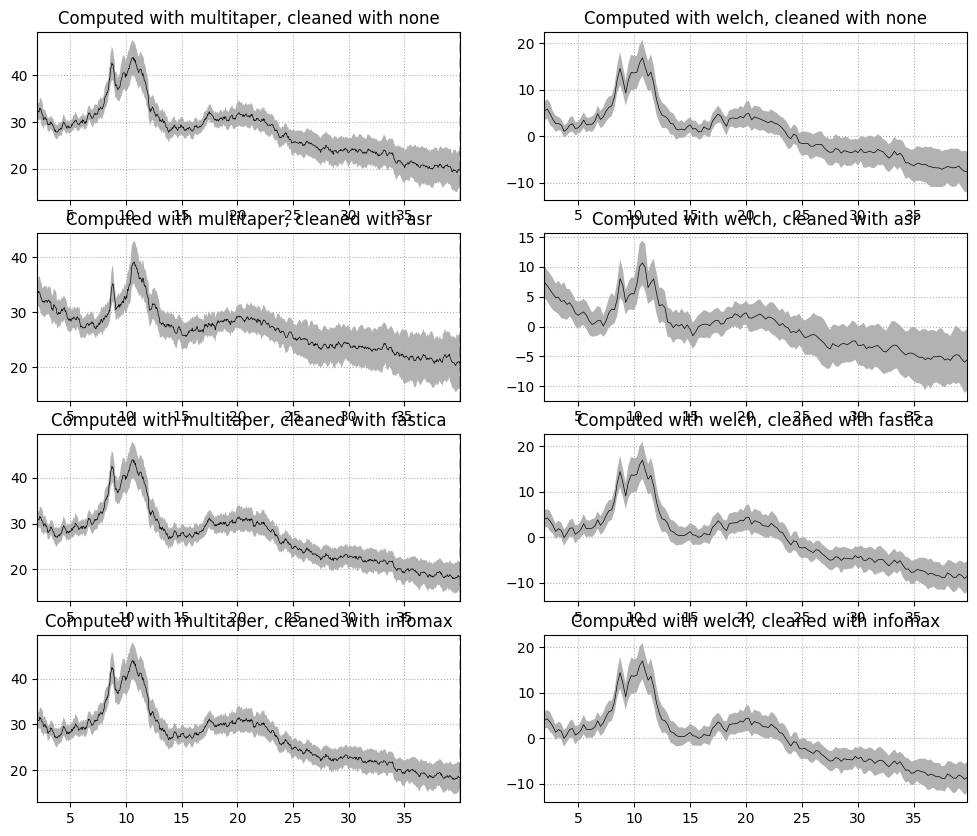

In [32]:
fig, axs = plt.subplots(len(rs_allepochs), 2, figsize=(12,10))
for j, (method, rs_epochs) in enumerate(rs_allepochs.items()):
    for i, compute_method in enumerate(['multitaper', 'welch']):
        ax = axs[j, i]
        rs_psd = rs_epochs['EC'].compute_psd(method=compute_method, fmin=2.0, fmax=40.0)
        rs_psd.plot(dB=True, average=True, axes=ax)
        ax.set_title(f'Computed with {compute_method}, cleaned with {method}')

plt.show()

### Topomap

Effective window size : 4.000 (s)
Effective window size : 4.000 (s)
Effective window size : 4.000 (s)
Effective window size : 4.000 (s)
none
EO


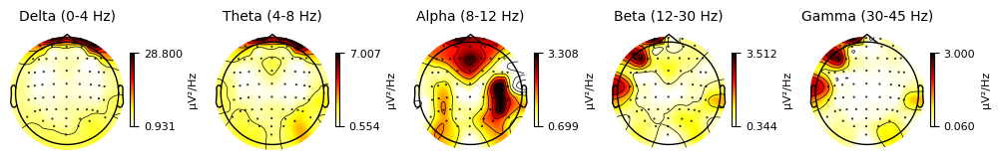

EC


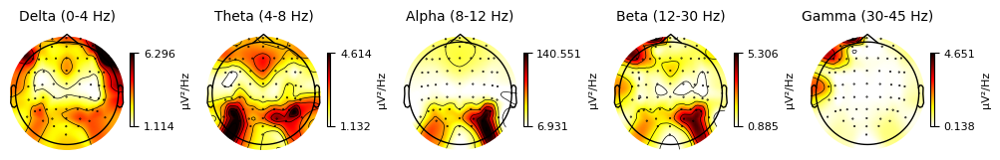

----------------
asr
EO


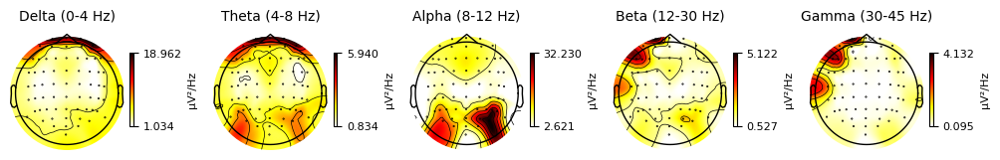

EC


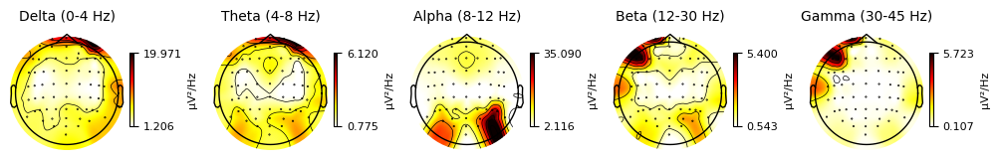

----------------
fastica
EO


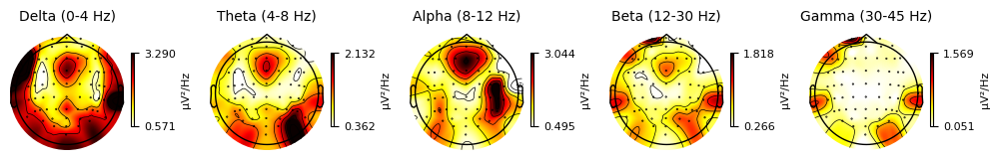

EC


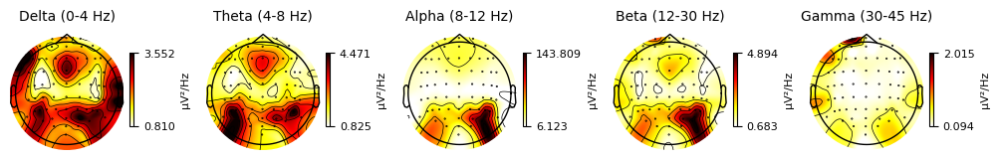

----------------
infomax
EO


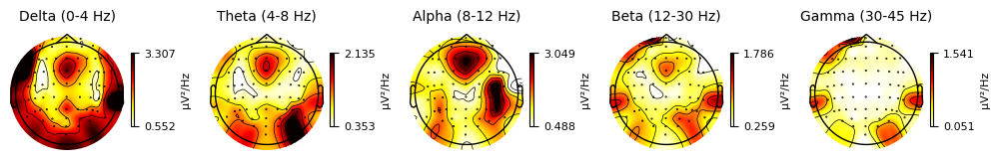

EC


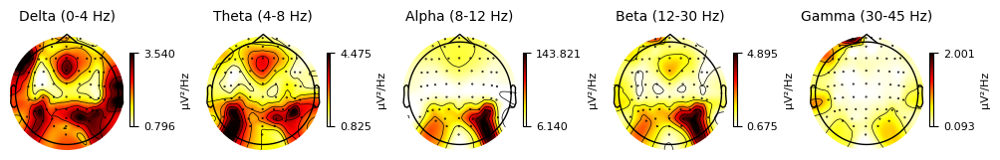

----------------


In [33]:
triggers = ['EO', 'EC']
compute_method = 'welch'
rs_allpsd = {method:rs_epochs.compute_psd(method=compute_method, fmin=2.0, fmax=40.0) for method, rs_epochs in rs_allepochs.items()}
for method, rs_psd in rs_allpsd.items():
    print(method)
    for trigger in triggers :
        print(trigger)
        rs_psd[trigger].plot_topomap(cmap='hot_r')
        plt.show()
    print('----------------')

### PO Alpha power

In [34]:
rs_allpsd_allbanddf = []
for method, rs_psd in rs_allpsd.items():
    rs_psd_df = rs_psd.to_data_frame(long_format=True).drop(columns=['ch_type'])
    rs_psd_df['band'] = rs_psd_df['freq'].apply(freq_to_band, bands=bands)
    rs_bandf = rs_psd_df.copy().dropna().drop(columns=['freq']).groupby(by=['condition', 'epoch', 'channel', 'band'], observed=True).mean().reset_index()
    rs_bandf['method'] = method
    rs_allpsd_allbanddf.append(rs_bandf)

rs_allpsd_banddf = pd.concat(rs_allpsd_allbanddf)
rs_allpsd_banddf

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


,condition,epoch,channel,band,value,method
0,EC,2,AF3,alpha,3.691341e-11,none
1,EC,2,AF3,gamma,5.835903e-13,none
2,EC,2,AF3,highbeta,1.317180e-12,none
3,EC,2,AF3,lowbeta,1.893478e-12,none
4,EC,2,AF3,theta,2.722458e-12,none
...,...,...,...,...,...,...
1915,EO,5,TP8,alpha,2.686221e-12,infomax
1916,EO,5,TP8,gamma,5.605683e-13,infomax
1917,EO,5,TP8,highbeta,9.839607e-13,infomax
1918,EO,5,TP8,lowbeta,7.111586e-13,infomax


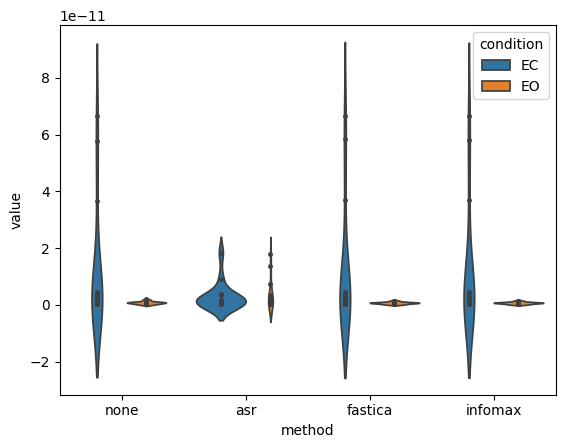

In [35]:
plot_df = rs_allpsd_banddf[rs_allpsd_banddf['channel']=='POz']
sns.violinplot(data=plot_df, x='method', hue='condition', y='value', inner="point")
plt.show()

# Auditory Oddball

## Epoching

In [36]:
triggers = ['normal', 'odd']
current_event_dict = {key:value for key, value in original_event_dict.items() if key in triggers}

tmin = -0.2  # start of each epoch 
tmax = 1  # end of each epoch
baseline = (-0.2, 0)  # means from t before to stim onset (t = 0)
picks = mne.pick_types(clean.info, eeg=True)
reject = None # this can be highly data dependent

oddball_allepochs = {}
for method, fullclean in fullclean_dict.items() :
    oddball_allepochs[method] = mne.Epochs(fullclean, events, current_event_dict, tmin, tmax, proj=True,
                        picks=picks, baseline=baseline,
                        reject=reject, preload=True)

Not setting metadata
160 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 160 events and 615 original time points ...
0 bad epochs dropped
Not setting metadata
160 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 160 events and 615 original time points ...
0 bad epochs dropped
Not setting metadata
160 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 160 events and 615 original time points ...
0 bad epochs dropped
Not setting metadata
160 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 160 events and 615 original time points ...
0 bad epochs dropped


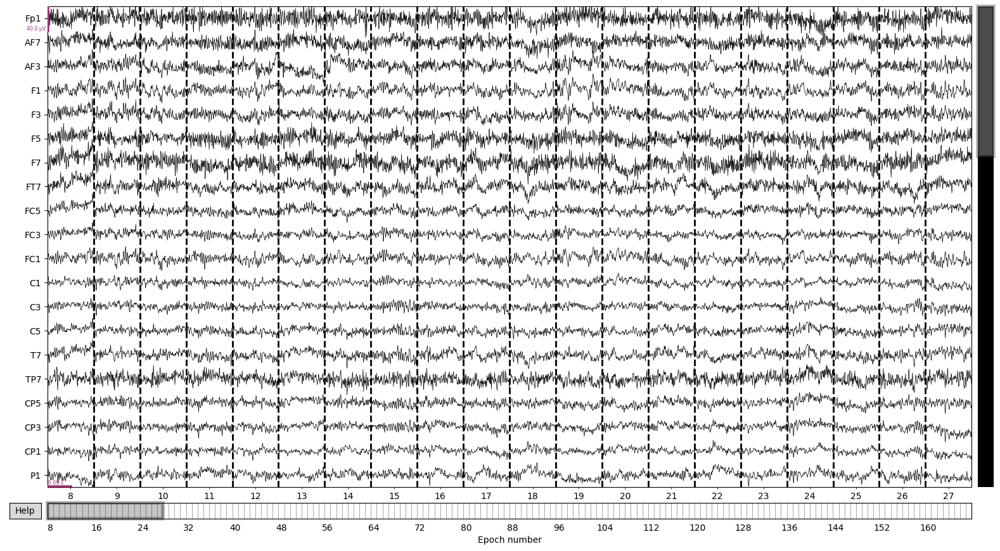

In [37]:
oddball_allepochs['fastica'].plot();

## ERPs Visualization

In [38]:
triggers = ['normal', 'odd']
evoked_alldict = {}
for method, oddball_epochs in oddball_allepochs.items():
    evoked_alldict[method] = {condition:list(oddball_epochs[condition].iter_evoked()) for condition in triggers}

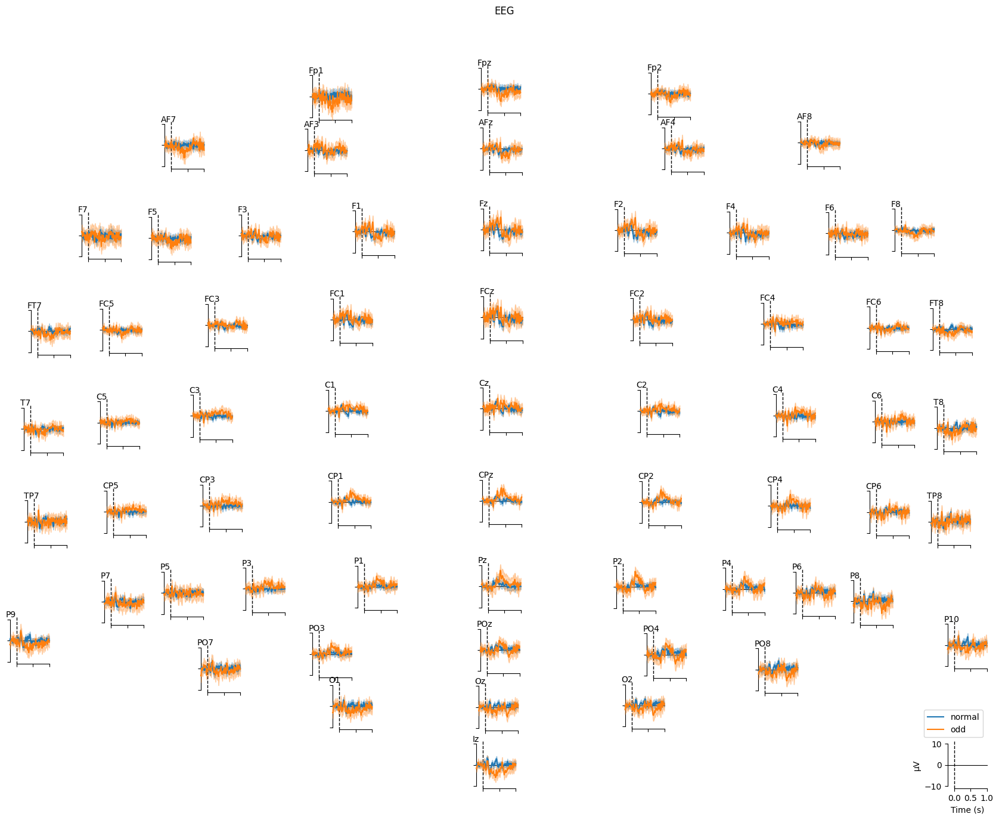

In [39]:
mne.viz.plot_compare_evokeds(
    evoked_alldict['fastica'],
    picks="eeg",
    colors={condition:i for i, condition in enumerate(triggers)},
    # linestyles=dict(left="solid", right="dashed"),
    axes="topo",
    # styles=dict(aud=dict(linewidth=1), vis=dict(linewidth=1)),
);

combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1852619942.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1852619942.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1852619942.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1852619942.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1852619942.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1852619942.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1852619942.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


combining channels using "mean"
combining channels using "mean"


C:\Users\ma.rihet\AppData\Local\Temp\ipykernel_17912\1852619942.py:7: RuntimeWarning: Only 1 channel in "picks"; cannot combine by method "mean".
  mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)


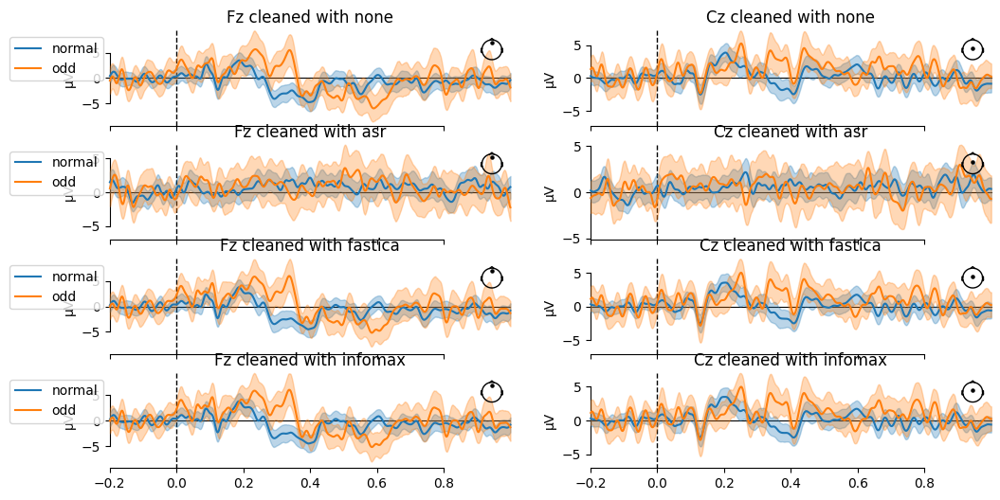

In [40]:
picks = ['Fz', 'Cz']
fig, axs = plt.subplots(len(evoked_alldict),len(picks), figsize = (12,6), sharex=True)

for j, (method, evoked_dict) in enumerate(evoked_alldict.items()):
    for i, ch in enumerate(picks):
        ax = axs[j, i]
        mne.viz.plot_compare_evokeds(evoked_dict, combine = "mean", picks = ch, show=False, axes=ax)
        
        if i == 0:
            ax.legend(bbox_to_anchor=(0,1))
        else:
            ax.get_legend().remove()
            
        if int(i/len(axs[0])) != len(axs[0])-1:
            ax.set_xlabel(None)

        ax.set_title(f'{ch} cleaned with {method}')

plt.show()

## Topomap

No projector specified for this dataset. Please consider the method self.add_proj.


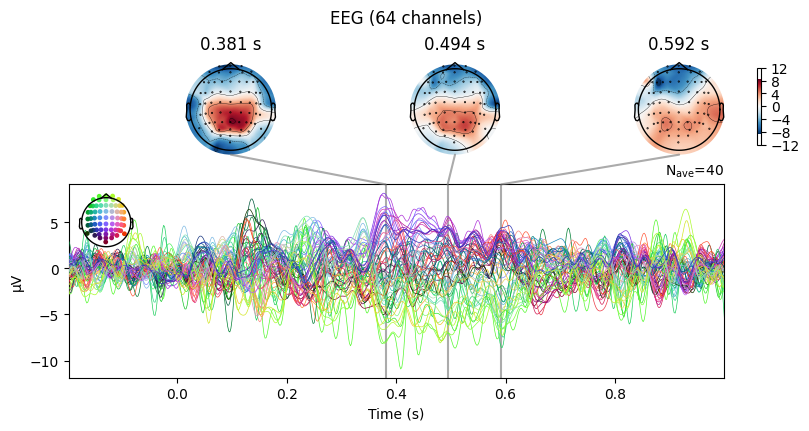

No projector specified for this dataset. Please consider the method self.add_proj.


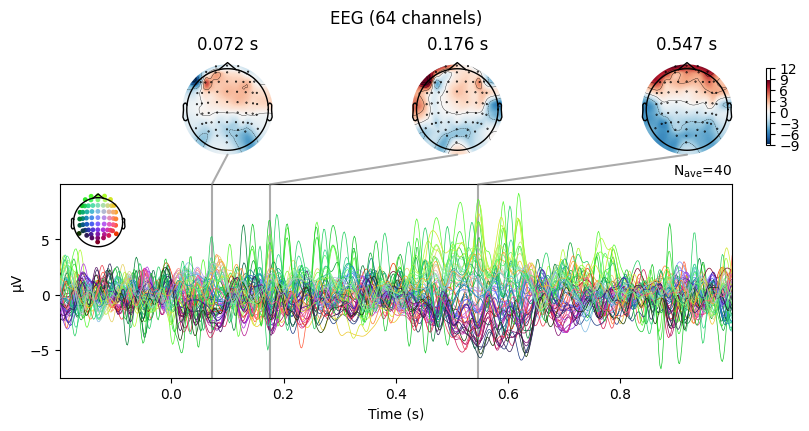

No projector specified for this dataset. Please consider the method self.add_proj.


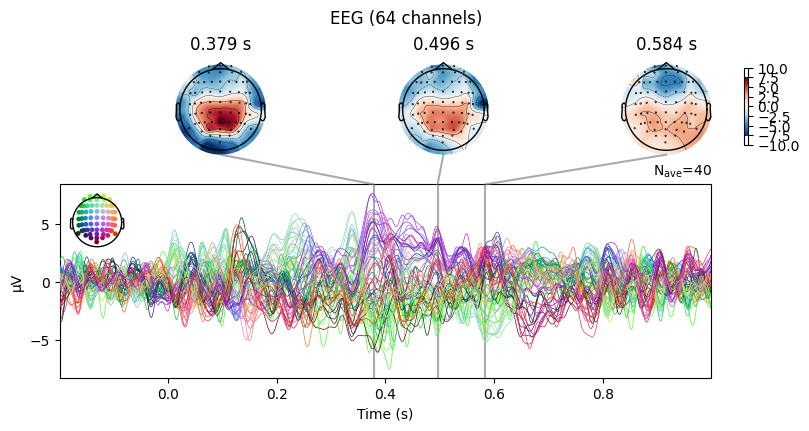

No projector specified for this dataset. Please consider the method self.add_proj.


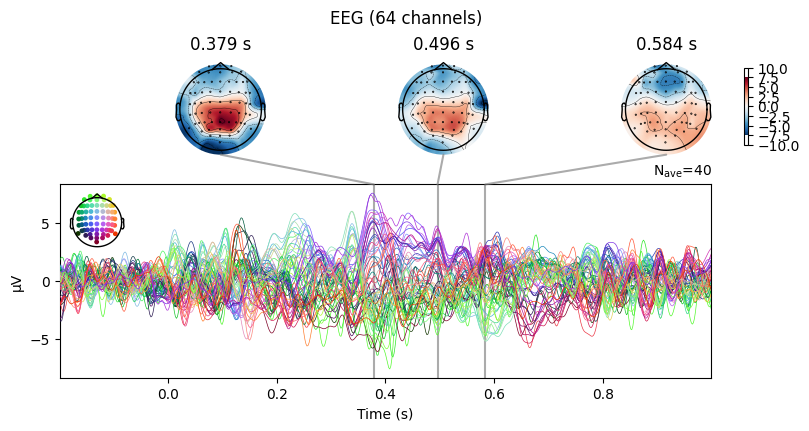

In [63]:
triggers = ['normal', 'odd']
mean_evoked_alldict = {}
for method, oddball_epochs in oddball_allepochs.items():
    mean_evoked_alldict[method] = {condition: oddball_epochs[condition].average() for condition in triggers}

for method, oddball_epochs in oddball_allepochs.items():
    print(method)
     mean_evoked_alldict[method]['odd'].plot_joint()

# Calculation Task

## Epoching

In [55]:
triggers = ['F pressed', 'D pressed']
rename_triggers = {'F pressed':'easy', 'D pressed':'hard'}
current_event_dict = {rename_triggers[key]:value for key, value in original_event_dict.items() if key in triggers}

tmin = -0.5  # start of each epoch 
tmax = 5  # end of each epoch
baseline = None  # means from t before to stim onset (t = 0)
picks = mne.pick_types(clean.info, eeg=True)
reject = None # this can be highly data dependent

calculation_allepochs = {}
for method, fullclean in fullclean_dict.items() :
    calculation_allepochs[method] = mne.Epochs(fullclean, events, current_event_dict, tmin, tmax, proj=True,
                        picks=picks, baseline=baseline,
                        reject=reject, preload=True)

Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 7 events and 2817 original time points ...
1 bad epochs dropped
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 7 events and 2817 original time points ...
3 bad epochs dropped
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 7 events and 2817 original time points ...
1 bad epochs dropped
Not setting metadata
7 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 7 events and 2817 original time points ...
1 bad epochs dropped


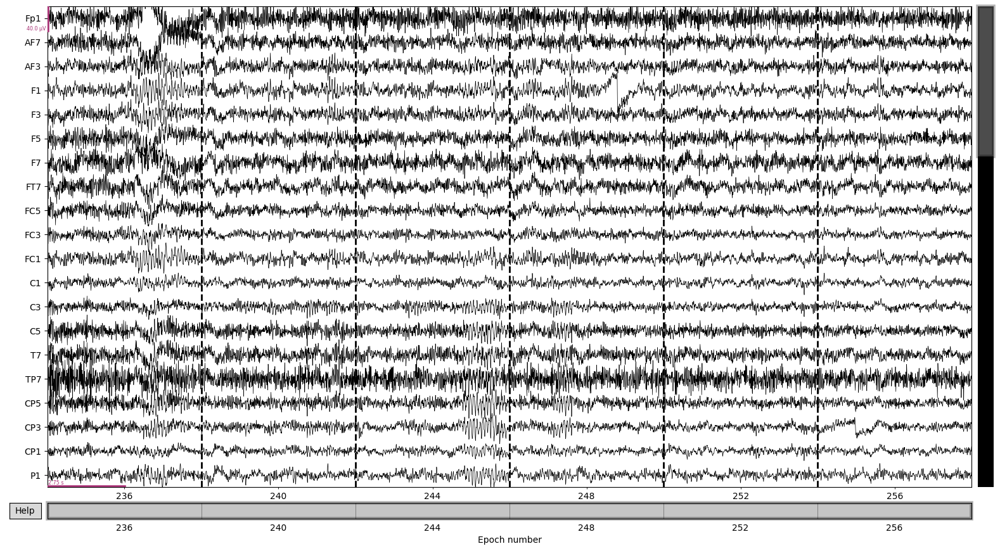

In [56]:
calculation_allepochs['fastica'].plot();

## Frequency Bands Visualization

Effective window size : 4.000 (s)
Effective window size : 4.000 (s)
Effective window size : 4.000 (s)
Effective window size : 4.000 (s)
none
easy


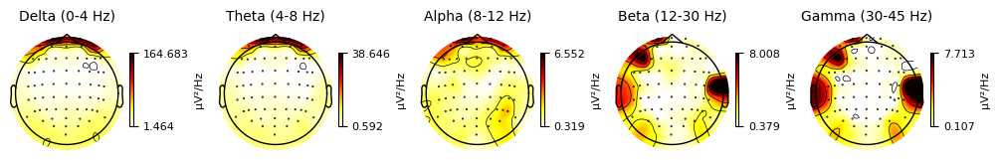

hard


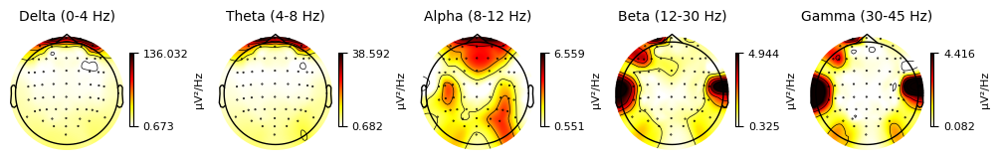

----------------
asr
easy


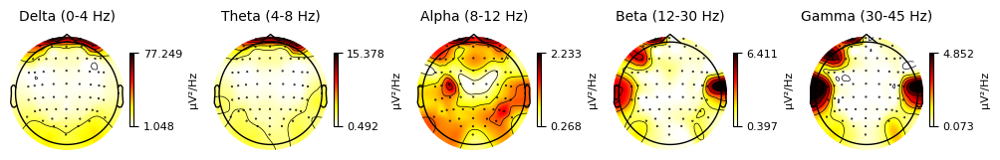

hard


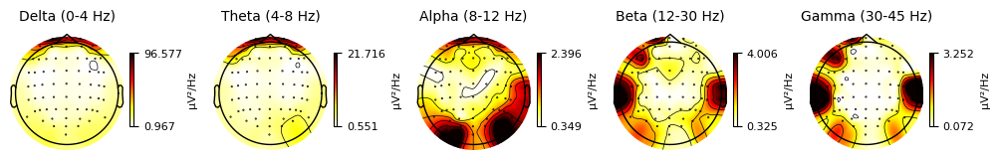

----------------
fastica
easy


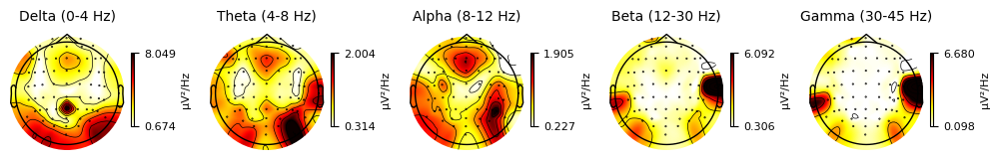

hard


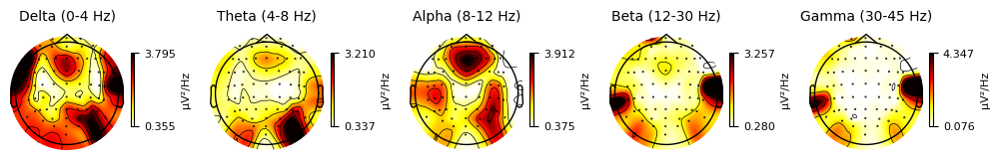

----------------
infomax
easy


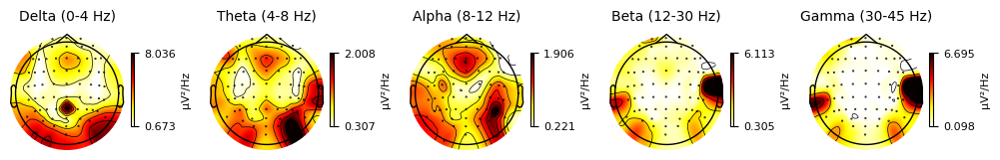

hard


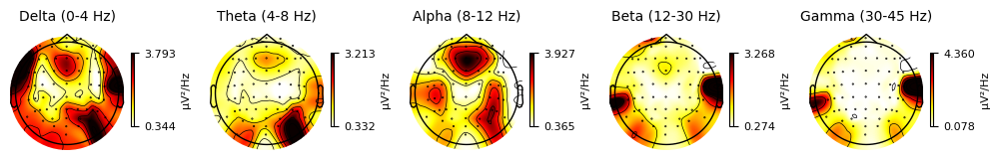

----------------


In [57]:
triggers = ['easy', 'hard']
compute_method = 'welch'
calculation_allpsd = {method:calculation_epochs.compute_psd(method=compute_method, fmin=2.0, fmax=40.0) for method, calculation_epochs in calculation_allepochs.items()}
for method, calculation_epochs in calculation_allpsd.items():
    print(method)
    for trigger in triggers :
        print(trigger)
        calculation_epochs[trigger].plot_topomap(cmap='hot_r')
        plt.show()
    print('----------------')

In [58]:
calculation_allpsd_allbanddf = []
for method, calculation_psd in calculation_allpsd.items():
    calculation_psd_df = calculation_psd.to_data_frame(long_format=True).drop(columns=['ch_type'])
    calculation_psd_df['band'] = calculation_psd_df['freq'].apply(freq_to_band, bands=bands)
    calculation_band_df = calculation_psd_df.copy().dropna().drop(columns=['freq']).groupby(by=['condition', 'epoch', 'channel', 'band'], observed=True).mean().reset_index()
    calculation_band_df['method'] = method
    calculation_allpsd_allbanddf.append(calculation_band_df)

calculation_allpsd_banddf = pd.concat(calculation_allpsd_allbanddf)
calculation_allpsd_banddf

Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...
Converting "condition" to "category"...
Converting "epoch" to "category"...
Converting "channel" to "category"...
Converting "ch_type" to "category"...


,condition,epoch,channel,band,value,method
0,easy,236,AF3,alpha,2.762485e-12,none
1,easy,236,AF3,gamma,1.064881e-12,none
2,easy,236,AF3,highbeta,1.122379e-12,none
3,easy,236,AF3,lowbeta,1.177372e-12,none
4,easy,236,AF3,theta,1.424094e-11,none
...,...,...,...,...,...,...
1915,hard,256,TP8,alpha,1.293180e-12,infomax
1916,hard,256,TP8,gamma,1.146899e-12,infomax
1917,hard,256,TP8,highbeta,9.402845e-13,infomax
1918,hard,256,TP8,lowbeta,9.162664e-13,infomax


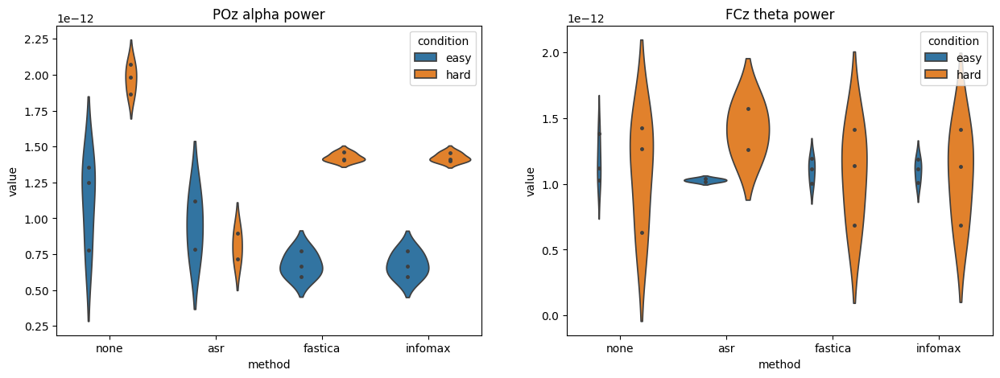

In [59]:
conditions = {
    'POz alpha power':{"channel": "POz","band": "alpha"},
    'FCz theta power':{"channel": "FCz","band": "theta"},
}

fig, axs = plt.subplots(1,2, figsize=(15,5))

for i, (label, params) in enumerate(conditions.items()):
    ax = axs[i]
    plot_df = calculation_allpsd_banddf.copy()
    for column, value in params.items():
        plot_df = plot_df[plot_df[column] == value]

    # display(plot_df)
    sns.violinplot(data=plot_df, x='method', hue='condition', y='value', inner='point', ax=ax)
    ax.set_title(label)

plt.show()

# Speed Caping

In [61]:
method = 'infomax'

In [62]:
oddball_mean_df = oddball_allepochs[method]
oddball_mean_df = oddball_epochs.to_data_frame().groupby(by=['condition', 'time']).mean().drop(columns=['epoch']).reset_index().melt(id_vars=['condition', 'time'], var_name='channel')
oddball_mean_df = oddball_mean_df.pivot(columns='condition', index=['time', 'channel'], values='value').reset_index()
oddball_mean_df.columns = oddball_mean_df.columns.to_list()

oddball_mean_df['contrast'] = oddball_mean_df['odd'] - oddball_mean_df['normal']
oddball_mean_df

,time,channel,normal,odd,contrast
0,-0.199207,AF3,0.030394,0.323945,0.293552
1,-0.199207,AF4,0.181663,0.313189,0.131526
2,-0.199207,AF7,2.214073,0.773519,-1.440554
3,-0.199207,AF8,-0.130332,0.460175,0.590508
4,-0.199207,AFz,0.232721,0.266346,0.033625
...,...,...,...,...,...
39355,0.999941,Pz,-0.003061,1.717784,1.720845
39356,0.999941,T7,0.463066,-1.213298,-1.676364
39357,0.999941,T8,0.543315,-0.442145,-0.985460
39358,0.999941,TP7,1.342692,-0.826491,-2.169183


In [63]:
calculation_band_df = calculation_allpsd_banddf[calculation_allpsd_banddf['method']==method]
calculation_band_df

,condition,epoch,channel,band,value,method
0,easy,236,AF3,alpha,1.369417e-12,infomax
1,easy,236,AF3,gamma,4.135415e-13,infomax
2,easy,236,AF3,highbeta,7.002149e-13,infomax
3,easy,236,AF3,lowbeta,9.745220e-13,infomax
4,easy,236,AF3,theta,1.011601e-12,infomax
...,...,...,...,...,...,...
1915,hard,256,TP8,alpha,1.293180e-12,infomax
1916,hard,256,TP8,gamma,1.146899e-12,infomax
1917,hard,256,TP8,highbeta,9.402845e-13,infomax
1918,hard,256,TP8,lowbeta,9.162664e-13,infomax
